# AGENDA

    1)How to do PCA Dimensionality Reduction?
    •Implement PCA in python!
    2)How to do t-SNE Dimensionality Reduction?
    •Implement t-SNE IN PYTHON!
    3)What is K-Means Clustering? 
    •Solve a "Kaggle Competition" using k-Means!
    4)What is hierarchical Clustering?
    •Implement hierarchical clustering!

# WHY DO WE USE DIMENSIONALITY REDUCTION?

    If our number of features is high, it may be useful to reduce it with an unsupervised step prior to supervised steps.
    Many of the Unsupervised learning methods implement a transform method that can be used to reduce the dimensionality.
    It is a very useful way to reduce model's complexity and avoid overfitting.

# 1)How to do PCA Dimensionality Reduction?
PCA = PRINCIPAL COMPONENT ANALYSIS!

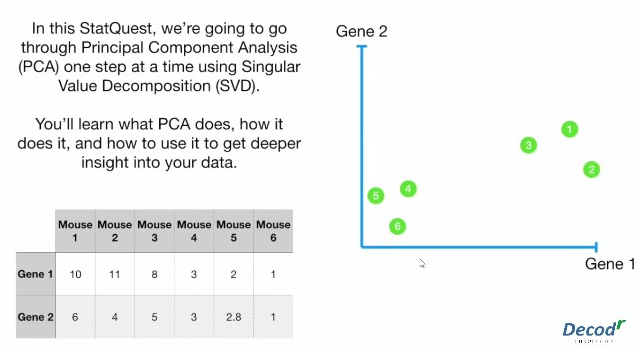

    HERE IF WE TAKE 1 GENE IN THE SENSE....WE COULD JUST PLOT THEM IN A SINGLE STRAIGHT LINE!---(1-D PLOT)
    IF WE TAKE 2 GENES....WE COULD JUST PLOT THEM WITH 2 AXIS(X,Y)(AS SHOWN IN THE ABOVE FIG!)---(2-D PLOT)
    IF WE TAKE 3 GENES....WE WOULD PLOT THEM WITH 3 AXIS(X,Y,Z)---(3-D PLOT)
BUT IF WE TAKE 4 GENES!
    
    WE CANNOT CREATE A PLOT AS WE COULD NOT PLOT THEM IN A 4 DIMENSIONAL PLOT!

# IN ORDER TO SOLVE THIS PROBLEM...HERE WE ARE GONNA USE PCA!
SO HERE WE ARE GONNA TALK ABOUT HOW PCA COULD TAKE 4 OR MORE GENE MEASUREMENTS(4 OR MORE DIMENSIONS OF DATA).........
AND MAKE A 2-D PCA PLOT!

WE'LL ALSO TALK ABOUT HOW "PCA" CAN TELL US WHICH GENE(OR VARIABLE) IS THE MOST VALUABLE FOR CLUSTERING THE DATA!
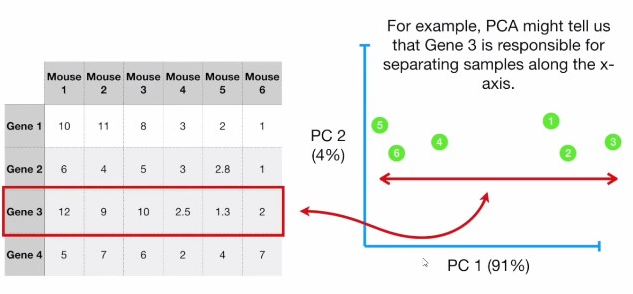
LASTLY WE CAN TALK ABOUT HOW PCA CAN TELL US HOW ACCURATE OUR 2-D GRAPH IS!

# TO UNDERSTAND WHAT PCA DOES! AND  HOW PCA WORKS!....LET'S GO BACK TO THE DATASET THAT HAD ONLY 2 GENES!
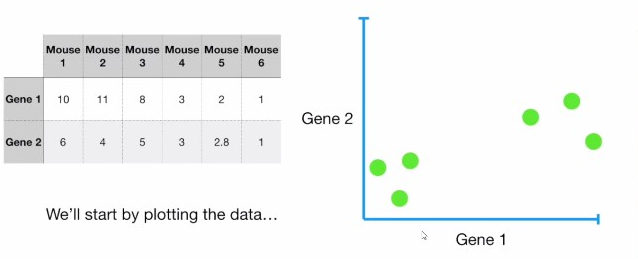

    THEN WE'LL CALCULATE THE AVERAGE MEASUREMENT FOR GENE 1 AND GENE 2!
    WITH THESE AVG VALUES, WE CAN CALCULATE THE CENTER OF THE DATA!
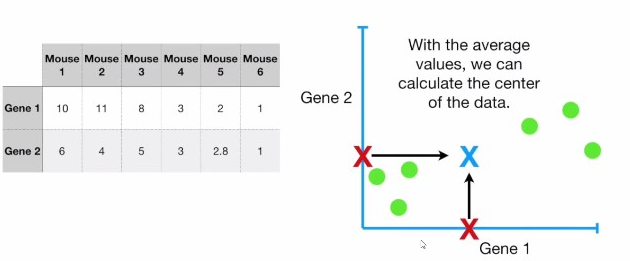
    

# NOW WE'LL SHIFT THE DATA...SO THAT THE CENTER IS ON THE TOP OF THE "ORIGIN"(0,0) IN THE GRAPH!
NOTE- SHIFTING THE DATA DOES NOT CHANGE HOW POINTS WERE POSITIONED RELATIVE TO EACH OTHER!
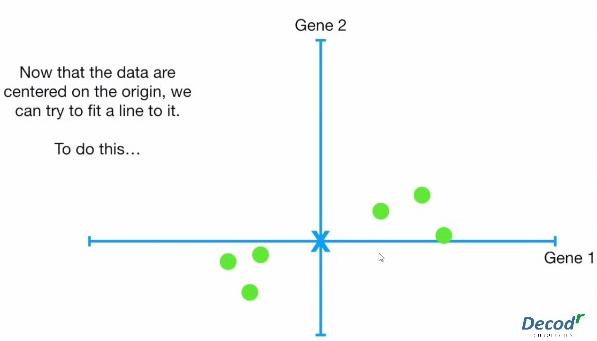

(TO DO THIS!)
    
    WE START DRAWING A RANDOM LINE THAT GOES THROUGH THE ORIGIN(0,0)!...AND ROTATE THE LINE UNTILL IT FITS THE DATA
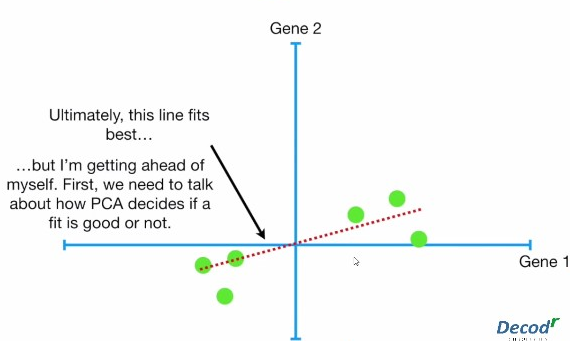

# TO FIND HOW PCA DECIDES IF IT'S A GOOD FIT OR NOT!

LET'S GO BACK TO THE INITIAL "RANDOM LINE" THAT PASSES THROUGH THE "ORIGIN"!
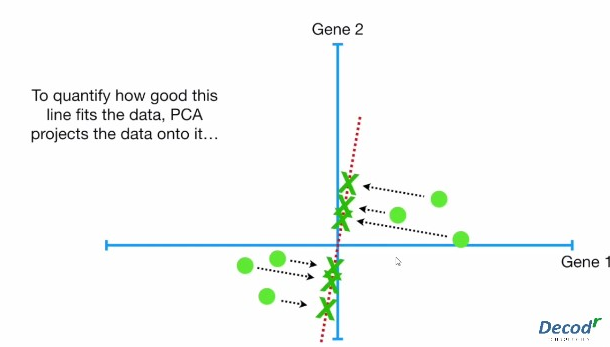

# THEN
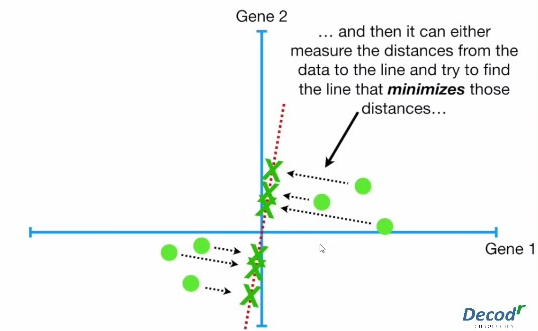
# OR
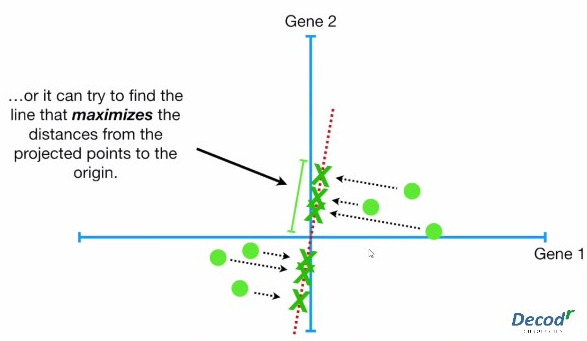

# NOTE-
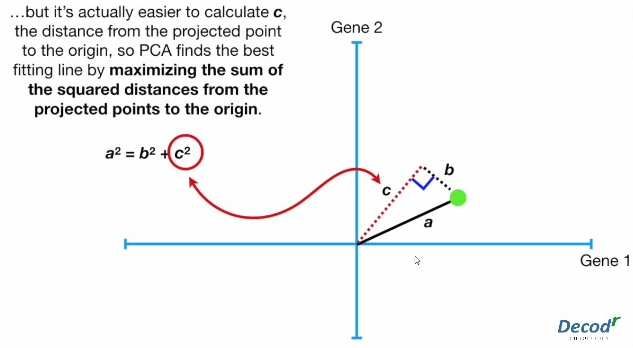

# JUST LIKE THIS!
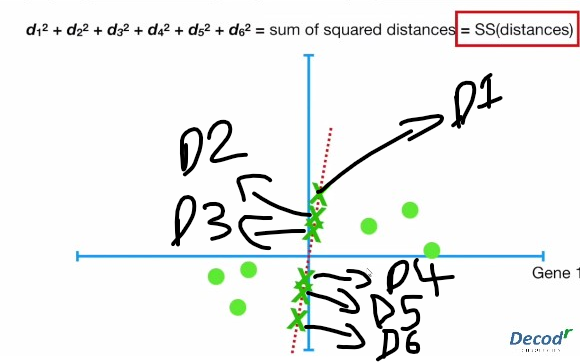

# THEN WE ROTATE THE LINE...(AGAIN AND AGAIN)!

    TO CHECK THE "SUM OF SQUARED DISTANCES(SS(DISTANCE)"....UNTILL WE END UP WITH THE LINE WITH LARGEST 
    "SS(DISTANCE" B\W THE PROJECTED POINTS AND THE ORIGIN!
# AND FINALLY!
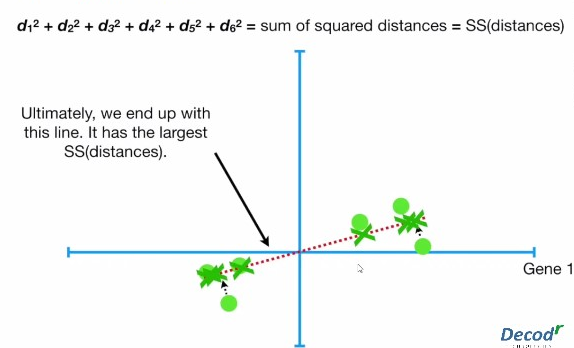
AND THIS LINE IS CALLED AS "PRINCIPAL COMPONENT 1(PC1)"
    
    THIS PC1 HAS A SLOPE OF 0.25!

THIS "0.25" IS ABOUT THE 4:1 RATIO OF DISTRIBUTION B\W "GENE 1" AND "GENE 2"
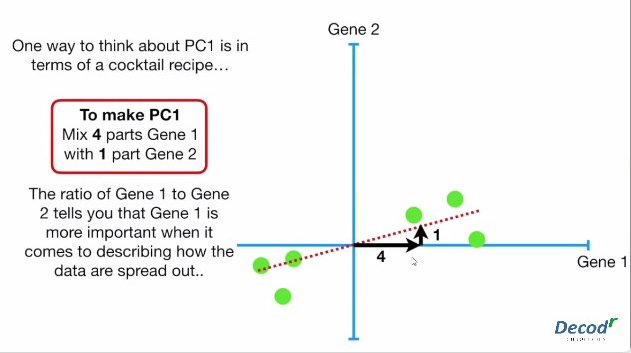
NOTE- COCKTAIL RECIPE REFERS TO THE "LINEAR COMBINATION" OF GENE 1 AND GENE 2!

# SO
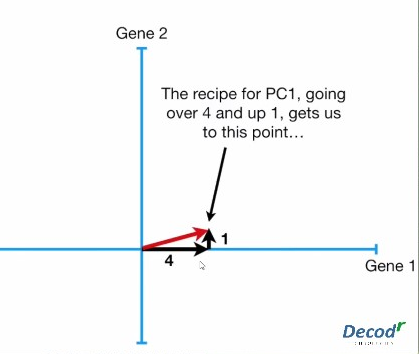

# NOW WE CAN FIND THE RED LINE USING PYTHAGOROUS THEOREM!
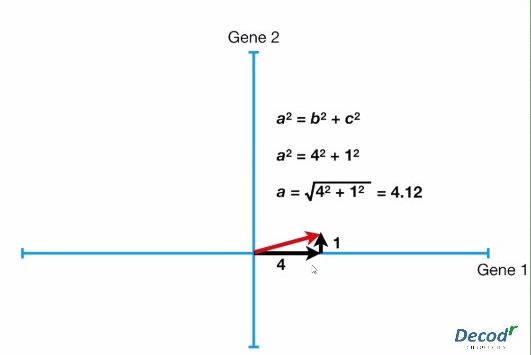

# NOW WE'VE TO DIVIDE ALL THE SIDE OF THIS TRIANGLE BY 4.12
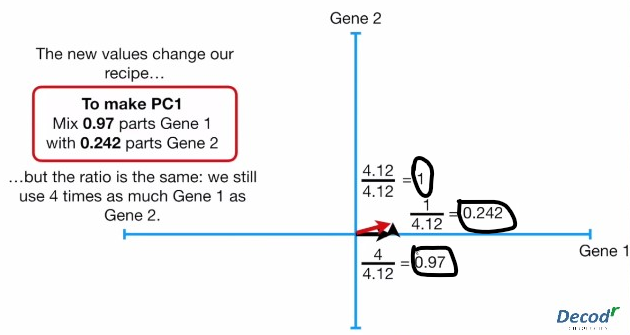

# NOTE- IN PC1 "GENE 1" IS 4 TIMES AS IMPORTANT AS "GENE 2"!
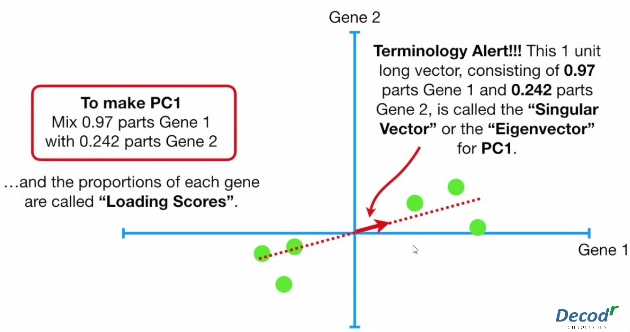

# AT LAST!
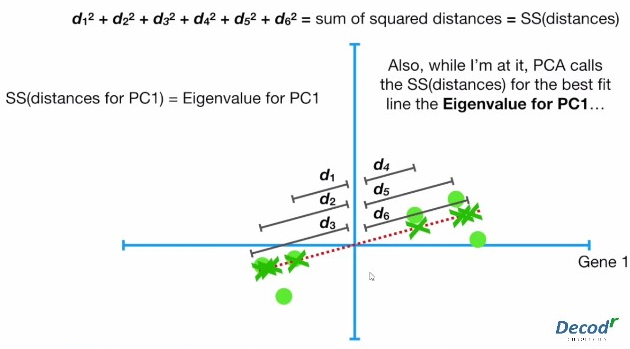

# TILL NOW WE'VE WORKED OUT WITH PC1...SO NOW WE ARE GONNA MOVE TO PC2!

BASCIALLY PC2 IS THE LINE THAT IS PERPINDICULAR TO PC1!
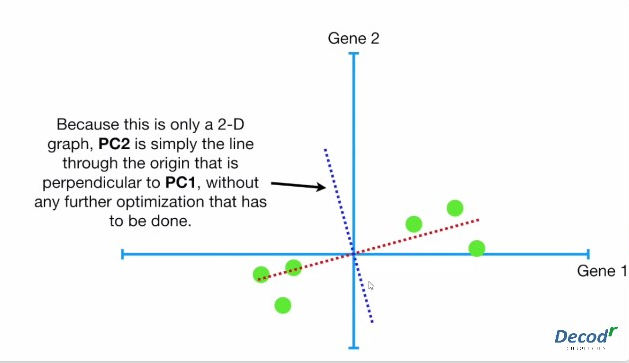

# AND THIS MEANS THAT THE RECIPE FOR PC2 IS 
    
    -1 PARTS OF GENE 1
    AND
    4 PARTS OF GENE 2!
# AND IF WE SCALE EVERYTHING (AS WE DID FOR PC1!)

    WE WOULD GET A UNIT VECTOR AND THE RECIPE WOULD BE...
    -0.242 PARTS GENE 1
    AND
    0.97 PARTS GENE 2
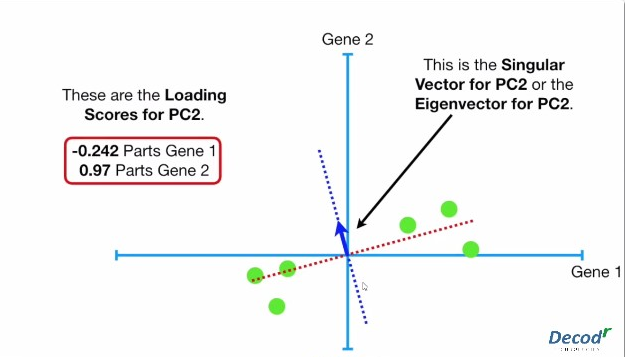

# NOTE- IN PC2 "GENE 2" IS 4 TIMES AS IMPORTANT AS "GENE 1"!

# LASTLY!
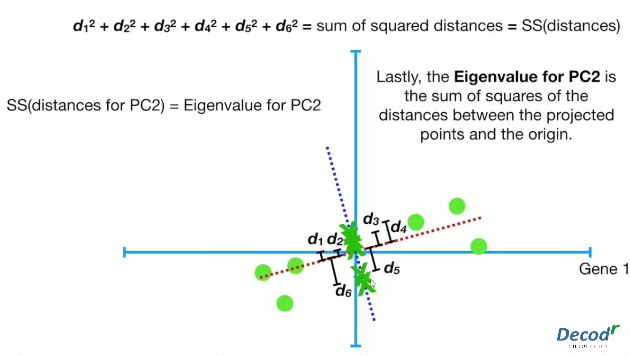

# DAMN....AT LAST WE'VE WORKED OUT WITH BOTH PC1 AND PC2!

# SO NOW....TO DRAW THE FINAL PCA PLOT!

WE SIMPLY ROTATE EVERYTHING SO THAT "PC1" WOULD BECOME HORIZONTAL AND "PC2" WOULD BECOME VERTICAL!

THEN WE USE THE THE PROJECTED POINTS TO FIND WHERE THE SAMPLES GO IN THE "PCA" PLOT!
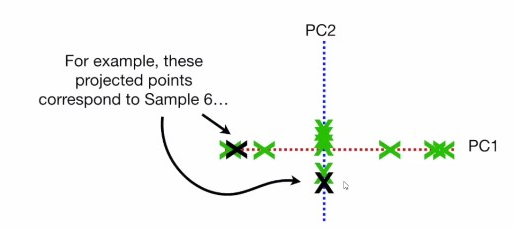

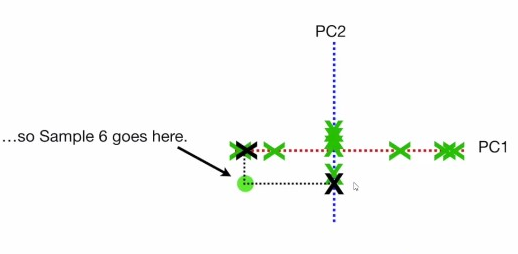

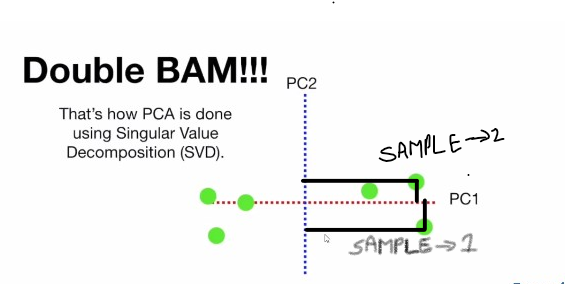

# stop right there....do you remember ss(distance)/eigenvalues?
WE CAN CONVERT THEM INTO "VARIATION" AROUND THE ORIGIN(0,0) BY DIVIDING THE SAMPLES SIZE MINUS 1(i.e,"n-1")

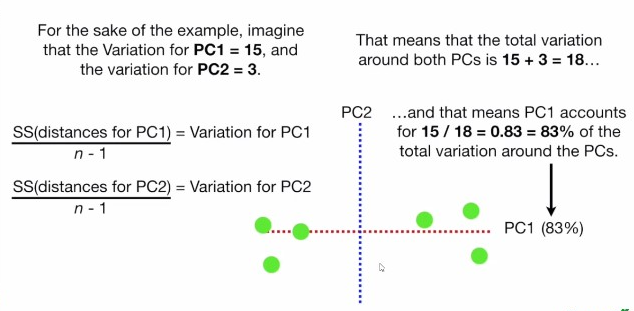

WHEREAS...PC2 ACCOUNTS FOR 3/18 = 0.17 = 17 % OF THE TOTAL VARIATION AROUND THE PC's(pc1 and pc2)

# NOTE:-
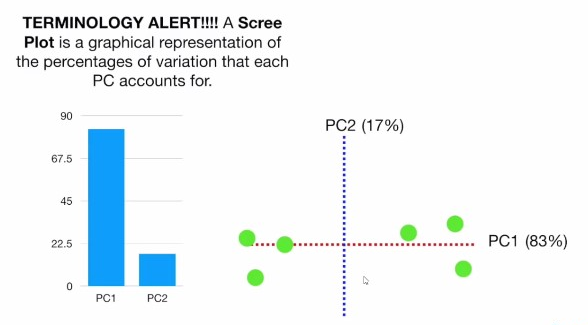

# •Implement PCA in python!

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.datasets import load_breast_cancer

In [3]:
cancer= load_breast_cancer() 

In [4]:
df= pd.DataFrame(cancer['data'],columns=cancer['feature_names'])

In [5]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
df.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension'],
      dtype='object')

In [7]:
df.shape

(569, 30)

In [8]:
from sklearn.preprocessing import StandardScaler

In [9]:
#INSTANTIATING THE StandardScaler as:"scaler"
scaler= StandardScaler()

In [10]:
scaled_data=scaler.fit_transform(df)

In [11]:
#IMPORTING PCA!
from sklearn.decomposition import PCA

In [12]:
#INSTATIATING PCA AS :"pca"
pca=PCA(n_components=2)
x_pca = pca.fit_transform(scaled_data)

In [13]:
x_pca.shape

(569, 2)

Text(0, 0.5, 'SECOND PRINCIPAL COMPONENT(PC2)')

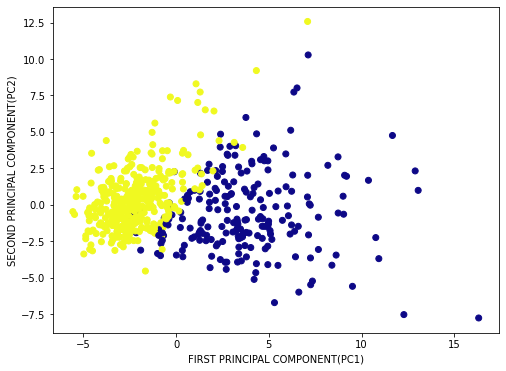

In [14]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=cancer['target'],cmap='plasma')
plt.xlabel("FIRST PRINCIPAL COMPONENT(PC1)")
plt.ylabel("SECOND PRINCIPAL COMPONENT(PC2)")

In [15]:
pca.components_

array([[ 0.21890244,  0.10372458,  0.22753729,  0.22099499,  0.14258969,
         0.23928535,  0.25840048,  0.26085376,  0.13816696,  0.06436335,
         0.20597878,  0.01742803,  0.21132592,  0.20286964,  0.01453145,
         0.17039345,  0.15358979,  0.1834174 ,  0.04249842,  0.10256832,
         0.22799663,  0.10446933,  0.23663968,  0.22487053,  0.12795256,
         0.21009588,  0.22876753,  0.25088597,  0.12290456,  0.13178394],
       [-0.23385713, -0.05970609, -0.21518136, -0.23107671,  0.18611302,
         0.15189161,  0.06016536, -0.0347675 ,  0.19034877,  0.36657547,
        -0.10555215,  0.08997968, -0.08945723, -0.15229263,  0.20443045,
         0.2327159 ,  0.19720728,  0.13032156,  0.183848  ,  0.28009203,
        -0.21986638, -0.0454673 , -0.19987843, -0.21935186,  0.17230435,
         0.14359317,  0.09796411, -0.00825724,  0.14188335,  0.27533947]])

<AxesSubplot:>

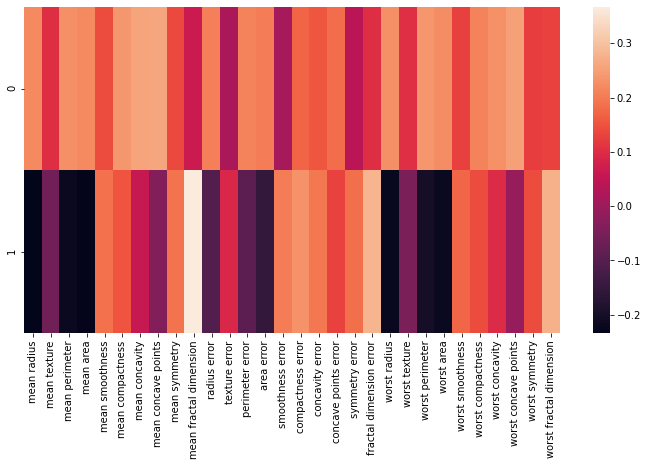

In [16]:
#CREATING A HEAT MAP!
df_comp= pd.DataFrame(pca.components_,columns = cancer['feature_names'])
plt.figure(figsize=(12,6))
sns.heatmap(df_comp)

# 2)How to do t-SNE Dimensionality Reduction?
FOR TIMEs SAKE!...LET'S CONSIDER THIS!

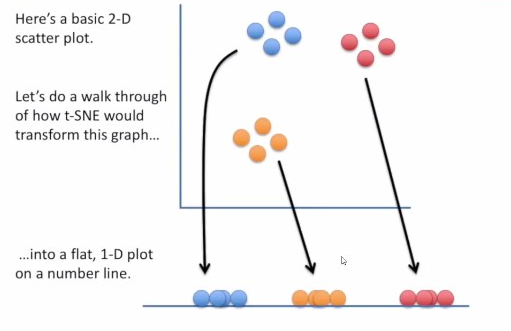
WE ARE GOING TO USE THIS SIMPLE EXAMPLE....TO UNDERSTAND THE CONCEPTS BEHIND t-SNE's...SO THAT WHEN WE SEE IT APPLIED TO A MUCH LARGER/COMPLEX DATASET(BIGGER DIMENSIONS!)....WE COULD STILL UNDERSTAND...HOW THE GRAPH HAS BEEN DRAWN!

# NOTE!
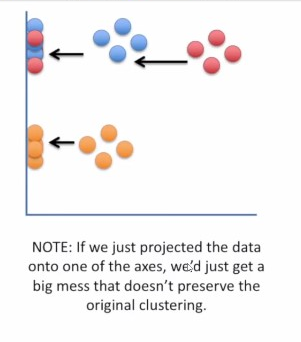
FOR EXAMPLE...IF WE PROJECT IT ONTO THE 'X' OR 'Y' AXIS!

    INSTEAD OF TWO DISTINCT CLUSTERS...WE WOULD JUST SEE A MISHMASH!

# SO LET'S SEE WHAT t-SNE DOES TO PROJECT A DATA INTO LOW DIMENSIONAL SPACE...SO THAT THE CLUSTERING IN THE HIGH DIMENSIONAL SPACE IS PRESERVED!

# t-SNEs WORKFLOW!
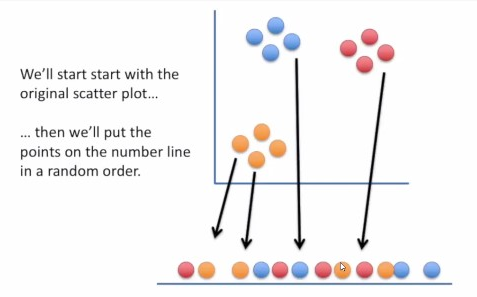

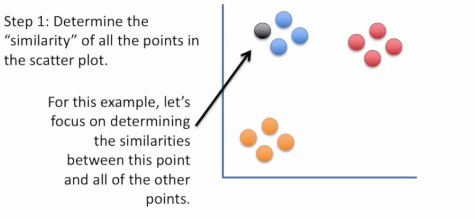
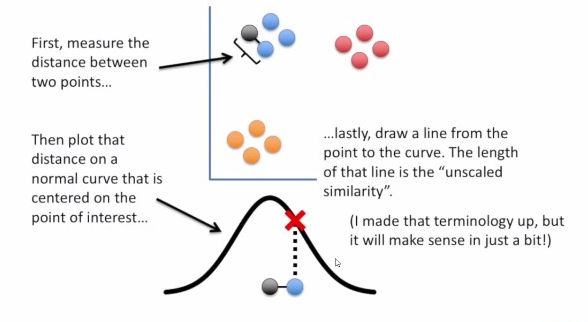

# NOTE- WE WILL SEE ABOUT UNSCALED SIMILARITY WITHIN A WHILE!

SIMILARLY WE HAVE TO MEASURE THE "UNSCALED SIMILARITY" OF ALL THE POINTS(IN PAIRS)(USING THE ABOVE METHOD!)
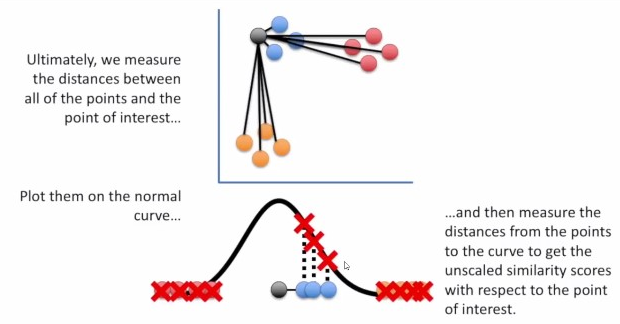

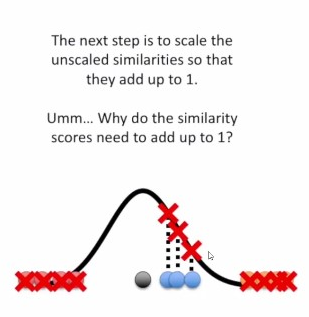
WELL....IT HAS DEAL WITH SOMETHING...WHICH WE HAVEN'T BEEN TOLD EARLIER!

AND TO ILLUSTRATE THE CONCEPT...WE NEED TO ADD A CLUSTER THAT IS HALF DENSE AS THE OTHER!

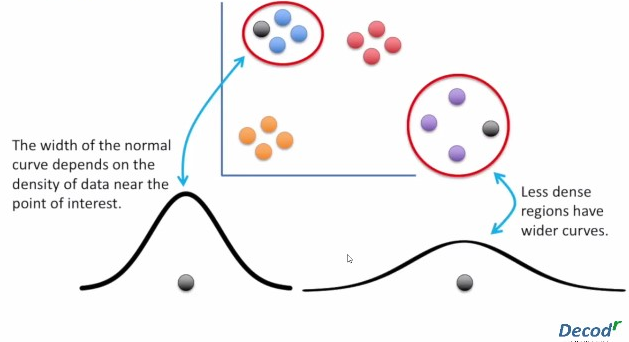
# SO!
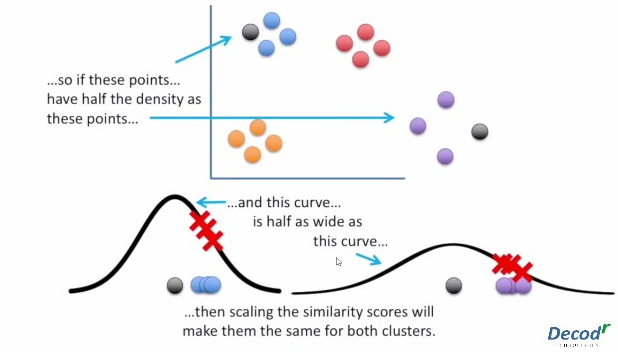

# NOW LET US COME BACK TO OUR NORMAL SCATTER PLOT!

# SO NOW...WE'VE TO FIND THE SIMILARITY SCORES FOR EACH POINT IN THE SCATTER PLOT!

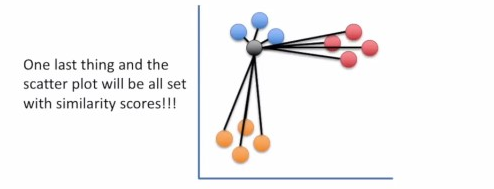

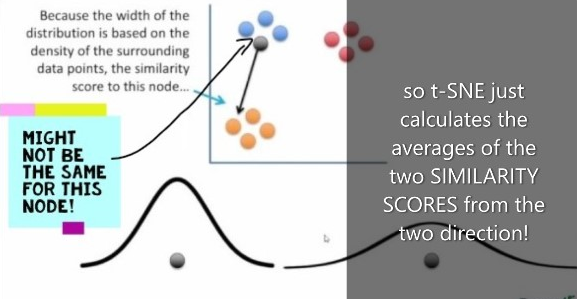

IN THE BELOW MATRIX EACH ROWS AND COLUMNS REPRESENTS THE SIMILARITY SCORES CALCULATED FROM THAT POINT OF INTEREST!

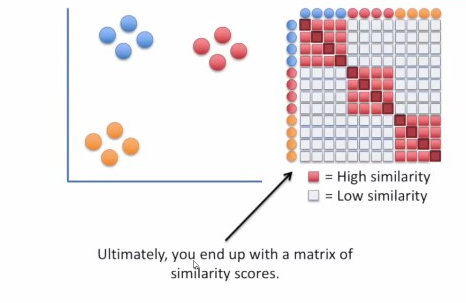

DARK RED = 0 (IT IS THE SIMILARITY FROM A POINT OF INTEREST TO "ITESLF"(JUST TO UNDERTSAND MATRIX)....AS IT DOES NOT MAKES SENSE TO SAY THAT A POINT IS SIMILAR TO ITSELF!...."t-SNE" ACTUALLY DEFINES THIS SIMILARITY AS ZERO(0))

# NO WE ARE DONE WITH THIS "SIMILARITY SCORES" FOR THE SCATTER PLOT!
LET'S JUMP BACK TO THE WORK FLOW OF "t-SNE"

SO JUST LIKE BEFORE....WE RANDOMLY PROJECT THE DATA IN A NUMBER LINE!...AND CALCULATE THE SIMILARITY SCORES FOR EVERY POINTS IN THE NUMBERLINE!
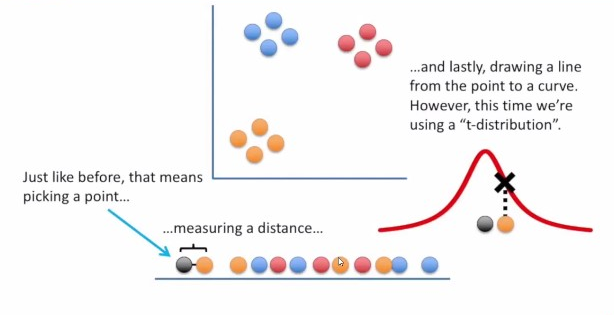

# THIS TIME...WE ARE USING A t-distiribution!....
BCOZ...WITHOUT THE "t-DISTRIBUTION"...ALL THE CLUSTERS WOULD CLUMP UP IN THE MIDDLE AND HARDER TO SEE!
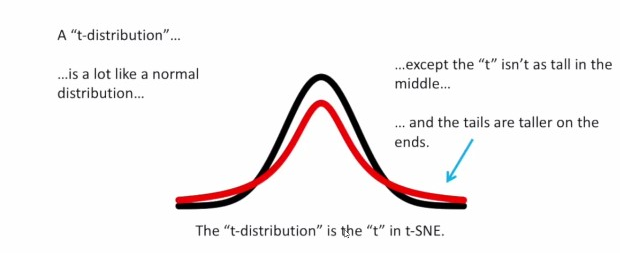

SO BY DOING THIS...WE CALCULATE THE UNSCALED SIMILARITIES FOR ALL THE POINTS AND SCALE THEM(AS WE DID BEFORE)!

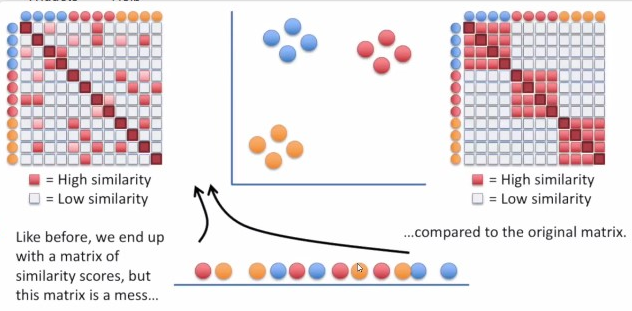
SO WE WANT MAKE THIS ROW(LEFT ONE) TO LOOK LIKE THAT ROW(RIGHT ONE)!

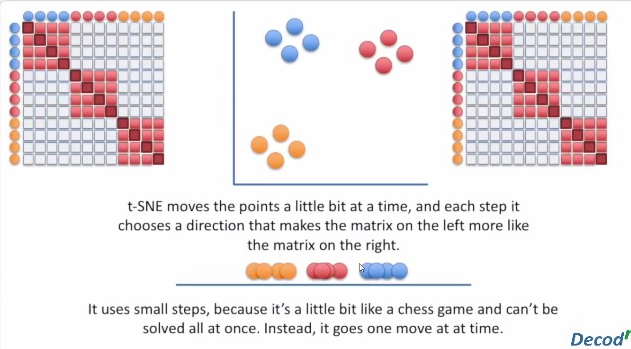

# AND NOW....WE ARE DONE WITH t-SNE's WORK FLOW!

                                    X--------X

# •Implement t-SNE IN PYTHON! 

In [17]:
# IMPORTING STUFFS!
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [18]:
df2= pd.read_csv("D:\DATASETS/mnist_train.csv")
df2.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [19]:
df2.shape

(60000, 785)

In [20]:
d= df2.drop("label",axis=1)
l= df2["label"]

In [21]:
from sklearn.preprocessing import StandardScaler

standardized_data= StandardScaler().fit_transform(d)
standardized_data.shape

(60000, 784)

In [22]:
#NOW WE ARE GONNA CONSIDER THE TOP 1000 VALUES ALONE!
data_1000 = standardized_data[0:1000,:] #HERE COLON IS SIGNIFIED TO GET ALL THE POINTS....INCLUDING 1000th VALUE!
labels_1000= l[0:1000]

In [23]:
from sklearn.manifold import TSNE

model = TSNE(n_components = 2,random_state= 0)
tsne_data = model.fit_transform(data_1000)

In [24]:
tsne_data = np.vstack ((tsne_data.T,labels_1000)).T
#what is the purpose of this line?

In [25]:
tsne_df = pd.DataFrame(data= tsne_data,columns= ("Dim1","Dim2","label"))

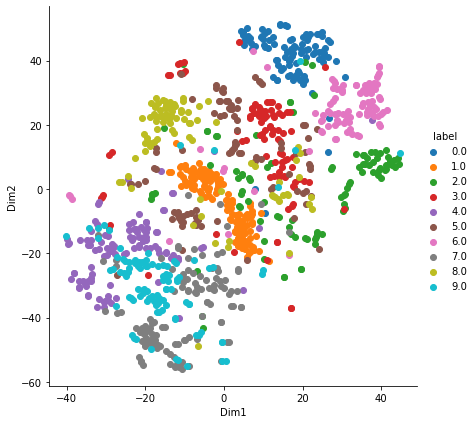

In [26]:
sns.FacetGrid(tsne_df,hue= "label",height = 6).map(plt.scatter,"Dim1","Dim2").add_legend()
plt.show()

# 3)What is K-Means Clustering?

WE ARE GONNA LEARN....HOW TO CLUSTER SAMPLES THAT CAN BE REPRESENTED 

    ON A STRAIGHT LINE
    ON A X,Y GRAPH
    AND EVEN...ON A HEAT MAP!
WE WILL ALSO TALK ABOUT...HOW TO PICK THE BEST VALUE FOR K!

# SO WHERE DO WE USE K-MEANS CLUSTERING?
FOR EXAMPLE:
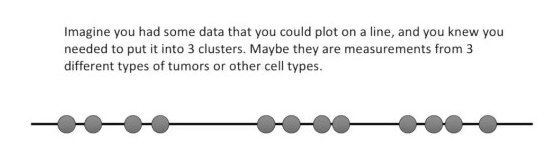
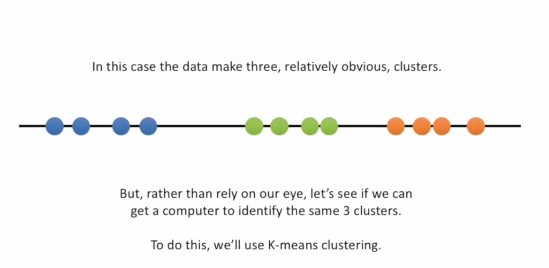

SO..WE'LL START WITH A RAW DATA THAT WE HAVEN'T YET CLUSTERED!
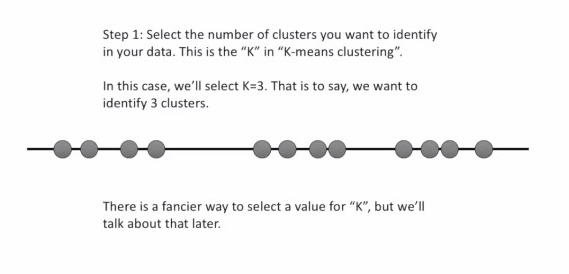
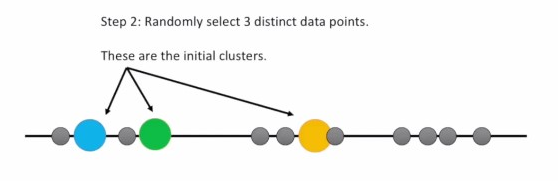
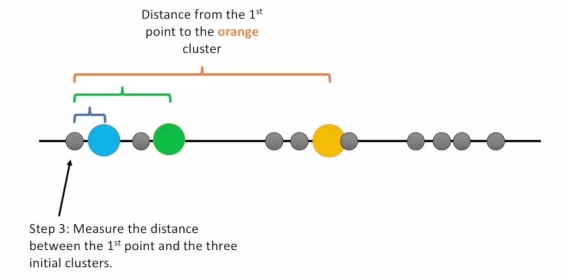
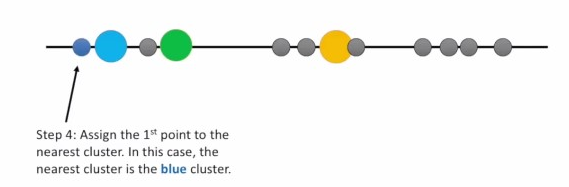

# SIMILARILY...DO THE EXACT 5 STEPS FOR THE 2ND POINT AND FOR THE REST OF THE REST OF THE POINTS!
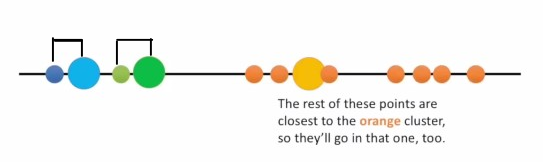
# AND NOW OUR CLUSTERING IS OVER!...AND WE SHALL PROCEED TO STEP 5!

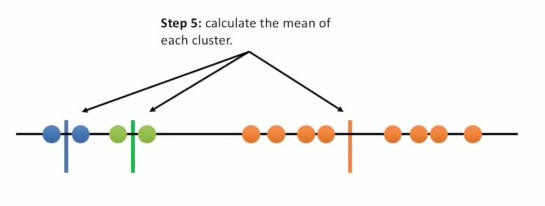
THEN WE REPEAT THE SAME THING AS WE DID BEFORE....THAT IS MEASURING AND CLUSTERING
# BUT THIS TIME WE USE THEIR MEAN VALUES
SINCE THE CLUSTERING DID NOT CHANGE AT ALL DURING THE LAST ITERATION...WE'RE DONE WITH CLUSTERING NOW!

# BY NOW WE WOULD HAVE UNDERSTOOD A POINT...THAT IS...THE K-MEANS CLUSTERING IS PRETTY TERRIBLE AS COMPARED TO WHAT WE DID WITH OUR EYES!
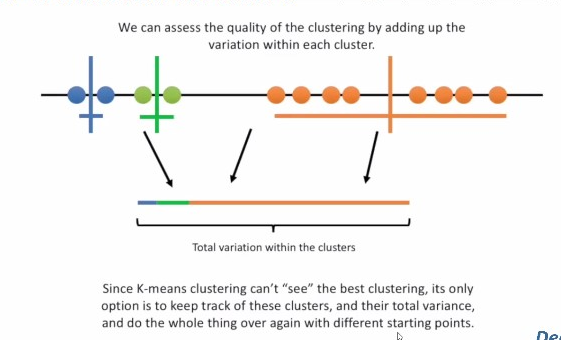

# SO LET'S GO BACK TO THE BEGINNING WHERE
K MEANS CLUSTERING PICKS UP THE 3 INITIAL CLUSTERS...!
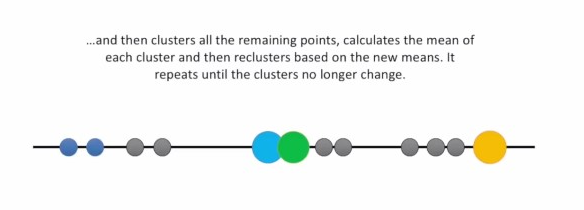
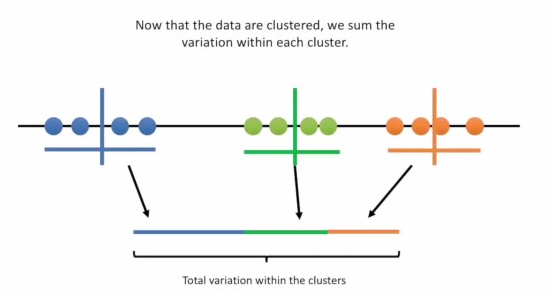

AND THEN WE DO THE SAME THINGS ONCE AGAIN WITH A FRESHLY PICKED "3 CLUSTERS"!
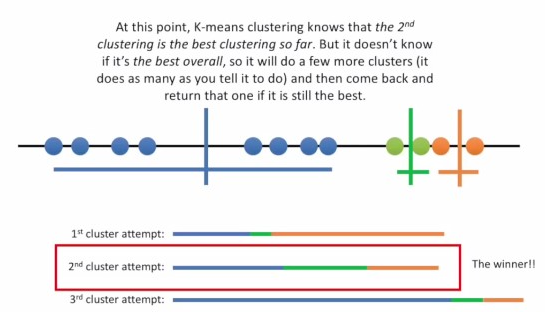

# NOW THE QUESTION IS...HOW DO WE CHOOSE A VALUE FOR "K"?

ONE WAY TO DECIDE IS TO JUST TRY DIFFERENT VALUES FOR K!

FOR EXAMPLE...
    
    TRY K=1,K=2,K=3,K=4 AND GET THE TOTAL VARIANCE FOR EACH CLUSTERS AND COMPARE THEM!
LET'S CONSIDER THIS AS THE RESULT VARIATIONS OF ALL 4 CLLUSTERS!
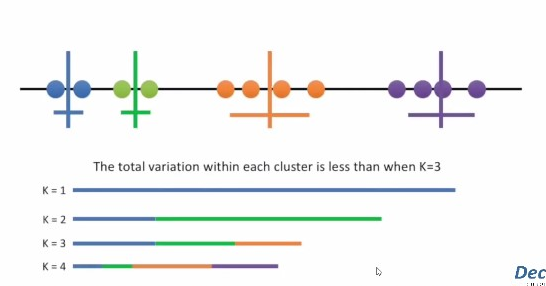
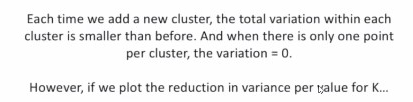
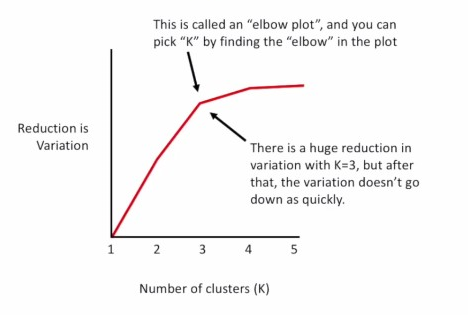

# Q/A
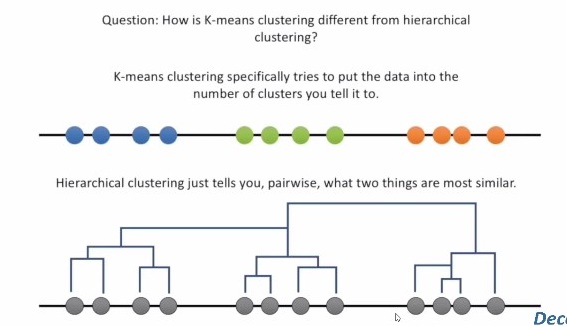

# ANOTHER Q/A!
QUESTION: WHAT IF OUR DATA IS SPOTTED ON A X,Y GRAPH?

ANSWER: JUST LIKE BEFORE, WE PICK 3 RANDOM POINTS!
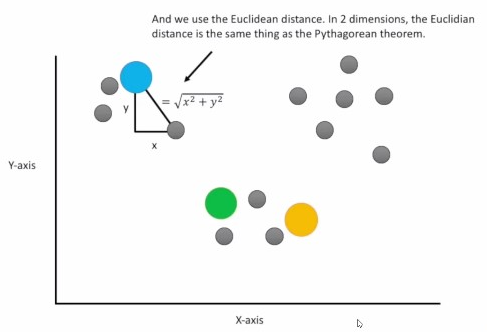
THEN,JUST LIKE BEFORE WE JUST ASSIGN THE POINT TO THE NEAREST CLUSTER!
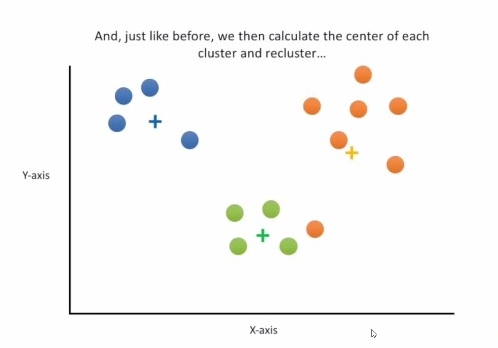

# NOTE- ALTHOUGH THIS LOOKS GOOD....SYSTEM DOESN'T KNOW THAT UNTILL IT DOES THE CLUSTERING A FEW MORE TIMES!

# ANOTHER Q/A
QUESTION: WHAT IF MY DATA IS A HEATMAP?

ANSWER: WELL IF JUST HAVE TWO SAMPLES..WE CAN RENAME THEM AS "X" AND "Y"...AND THEN WE CAN JUST PLOT THE DATA IN A X,Y GRAPH....
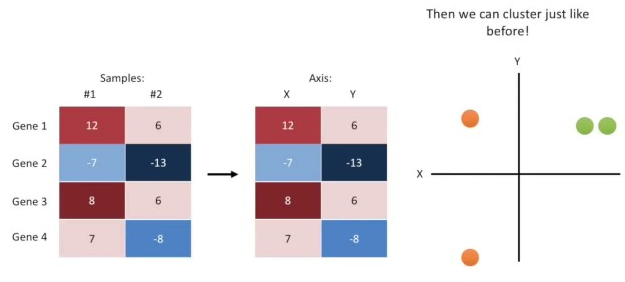

# NOTE-
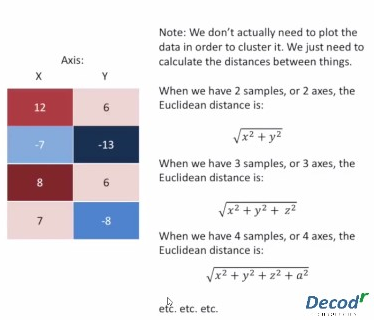

# •Solve a "Kaggle Competition" using k-Means!

HERE OUR TASK IS TO CLUSTER THE DATA INTO PPL WHO SURVIVED....AND DEAD!....

WE MAY GET A QUESTION...LIKE HOW DO WE CLUSTER AN ALREADY LABELED DATA?

WELL THE ANSWER IS SIMPLE...WE ARE JUST GONNA DROP THE "SURVIVED" COLUMN FROM THE DATA...BY THAT WE CAN MAKE THIS DATA TO BECOME A UNLABELLED DATA!

In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt

In [28]:
train = pd.read_csv("D:\DATASETS/titanic_train.csv")

In [29]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [30]:
train.shape

(891, 12)

In [31]:
train.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [32]:
train.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [33]:
# AS KMeans CLUSTERING DOES NOT SUPPORT THE DATA THAT HAS MISSING VALUES...
# LET'S FIX THIS MISSING VALUE ISSUE
train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [34]:
train.fillna(train.mean(),inplace = True)

In [35]:
train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [36]:
#SO LETS SEE SOME SAMPLE VALUES OF "TRAIN" AND "CABIN"!
train['Ticket'].head()

0           A/5 21171
1            PC 17599
2    STON/O2. 3101282
3              113803
4              373450
Name: Ticket, dtype: object

In [37]:
#SIMILARILY!
train['Cabin'].head()

0     NaN
1     C85
2     NaN
3    C123
4     NaN
Name: Cabin, dtype: object

In [38]:
# "PCLASS"!
train[["Pclass","Survived"]].groupby(["Pclass"],as_index = False).mean().sort_values(by= "Survived",ascending = False)

,Pclass,Survived
0,1,0.629630
1,2,0.472826
2,3,0.242363


In [39]:
# "SEX"!
train[["Sex","Survived"]].groupby(["Sex"],as_index = False).mean().sort_values(by= "Survived",ascending = False)

,Sex,Survived
0,female,0.742038
1,male,0.188908


In [40]:
# "SIBSP"!
train[["SibSp","Survived"]].groupby(["SibSp"],as_index = False).mean().sort_values(by= "Survived",ascending = False)

,SibSp,Survived
1,1,0.535885
2,2,0.464286
0,0,0.345395
3,3,0.250000
4,4,0.166667
5,5,0.000000
6,8,0.000000


In [41]:
# "PARCH"
train[["Parch","Survived"]].groupby(["Parch"],as_index = False).mean().sort_values(by= "Survived",ascending = False)

,Parch,Survived
3,3,0.600000
1,1,0.550847
2,2,0.500000
0,0,0.343658
5,5,0.200000
4,4,0.000000
6,6,0.000000


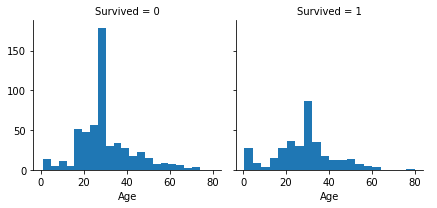

In [42]:
# AGE VS SURVIVED
g = sns.FacetGrid(train,col = "Survived")
g.map(plt.hist,"Age",bins = 20)
g.add_legend()

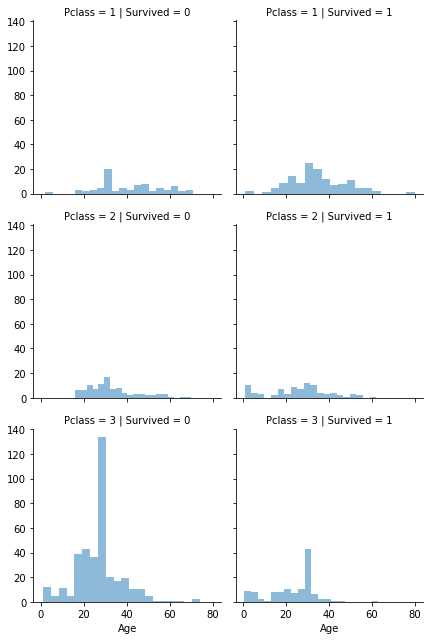

In [43]:
# PCLASS VS SURVIVED!
g = sns.FacetGrid(train,col = "Survived",row= "Pclass")
g.map(plt.hist,"Age",alpha= 0.5,bins = 20)
g.add_legend()

In [44]:
# LET'S SEE THE DATA TYPES OF DIFFERENT MODELS
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          891 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [45]:
train= train.drop(["Name","Cabin","Ticket","Embarked"],axis = 1)

In [46]:
# AS WE'VE DONE WITH DROPPING STUFFS!
# LET'S CONVERT THE NON NUMERIC DATAS INTO NUMERIC!
labelencoding = LabelEncoder()
train['Sex'] = labelencoding.fit_transform(train['Sex'])

In [47]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Sex          891 non-null    int32  
 4   Age          891 non-null    float64
 5   SibSp        891 non-null    int64  
 6   Parch        891 non-null    int64  
 7   Fare         891 non-null    float64
dtypes: float64(2), int32(1), int64(5)
memory usage: 52.3 KB


In [48]:
# NOW...WE SHALL BUILD OUR KMeans MODEL!
#LET US DROP THE SURVIVAL COLUMN!
x = train.drop(["Survived"],1).astype(float)

In [49]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Sex          891 non-null    int32  
 4   Age          891 non-null    float64
 5   SibSp        891 non-null    int64  
 6   Parch        891 non-null    int64  
 7   Fare         891 non-null    float64
dtypes: float64(2), int32(1), int64(5)
memory usage: 52.3 KB


In [50]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 2)
kmeans.fit(x)

KMeans(n_clusters=2)

<function matplotlib.pyplot.show(close=None, block=None)>

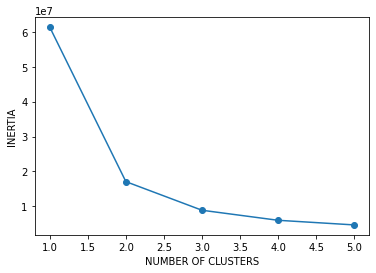

In [51]:
# NOW WE ARE GONNA PLOT AN ELBOW PLOT!...TO FIND THE BEST SUITABLE "K"

ks= range(1,6)
inertias = []
for k in ks:
    model = KMeans(n_clusters= k)
    model.fit(x)
    inertias.append(model.inertia_) # NOTE:-"inertia_" IS AN ATTRIBUT OF "KMeans"
                                    # DON'T GET CONFUSED IT WITH THE VARIABLE "inertias"
plt.plot(ks,inertias,"-o")
plt.xlabel("NUMBER OF CLUSTERS")
plt.ylabel("INERTIA")
plt.show

# 4)What is hierarchical Clustering?
NOTE- HIERARCHICAL CLUSTERING IS OFTEN ASSOCIATED WITH HEAT MAPS!

A SHORT VIEW ON HEAT MAP!
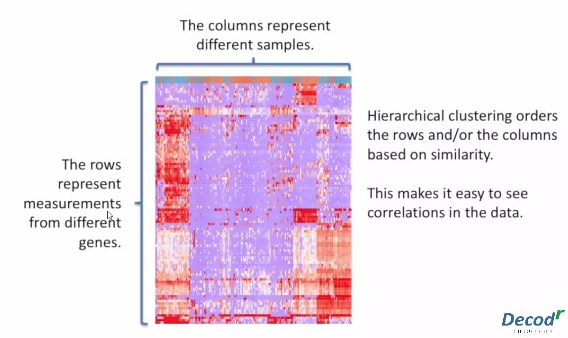
FOR EXAMPLE....
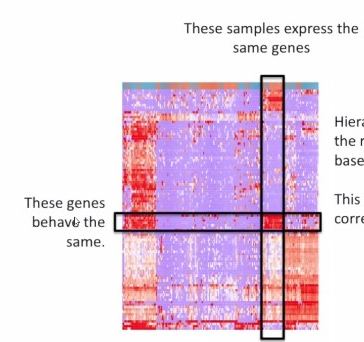

BY LOOKING THE BELOW PICTURE...WE CAN UNDERSTAND THAT!

THE CLUSTERING MAKES A BIG DIFFERENCE ON HOW THE DATA IS REPRESENTED!
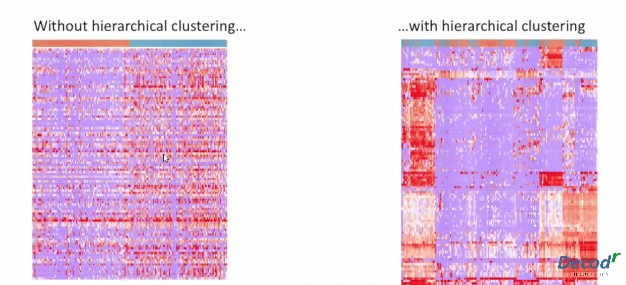
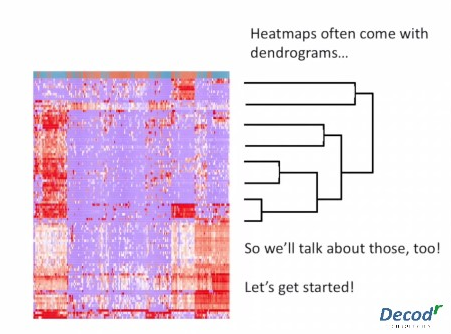

# WE WILL START WITH A SIMPLE EXAMPLE!

HERE WE HAVE A SIMPLE HEAT MAP...THAT HAS 3 SAMPLES AND 4 GENES!
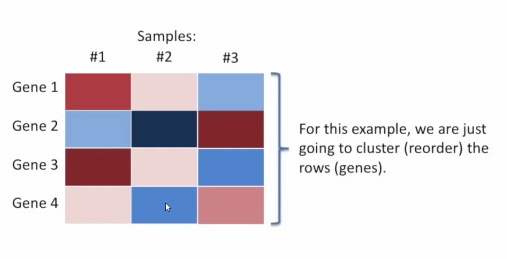

# STEP 1
IN THE BELOW PICTURE...WE ARE CHECKING THE SIMILARITY WITH THE HELP OF "COLOR"!
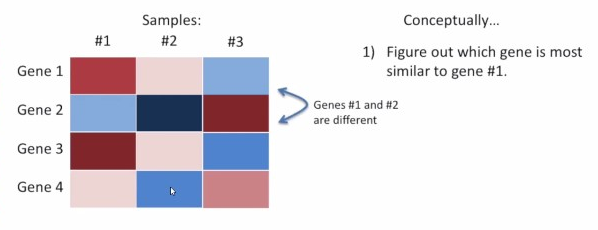
HERE...

    1_GENE #1 AND #2 ARE DIFFERENT!
    2_GENE #1 AND #3 ARE SIMILAR!
    3_GENE #1 AND #4 ARE ALSO SIMILAR!
HOWEVER,GENE #1 IS MOST SIMILAR TO GENE #3!

# STEP 2
HERE ALSO(STEP 2) WE DO ALL THE COMPARISION...AS WE DID IN THE 1ST STEP!
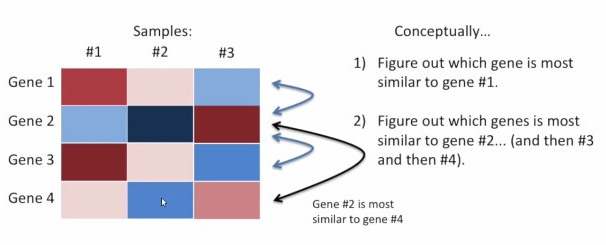
AND WE FIND THAT....GENE #2 IS MOST SIMILAR TO GENE #4
AND WE REPEAT IT TO GENE #3 AND GENE #4!

# STEP 3
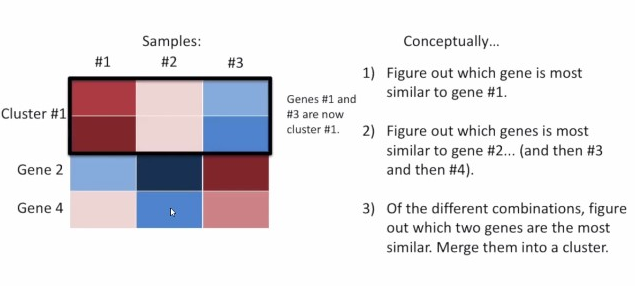
IN THIS CASE...GENE #1 AND GENE #3 ARE THE MOST SIMILAR COMBINATION...SO WE'VE CLUSTERED THEM!

# STEP 4
IN THIS STEP...WE JUST GO BACK TO "STEP 1"...BUT NOW WE ARE GONNA TREAT THE NEW CLUSTER LIKE A NEW "SINGLE GENE"!

WE JUST PERFORM THIS AS WE DID BEFORE!
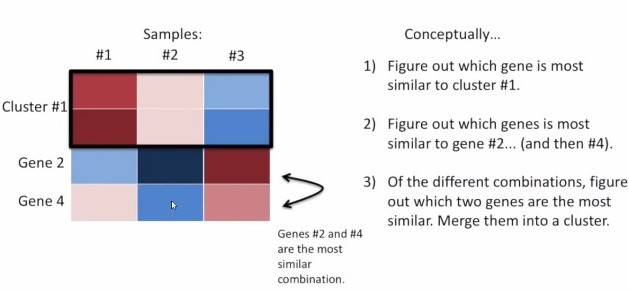
IN THIS CASE....GENE #2 AND GENE #4 ARE THE MOST SIMILAR COMBINATION!

AND NOW WE CLUSTER GENE #2 AND GENE #4
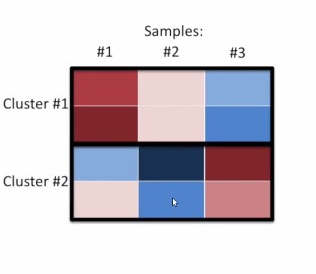
AND LET'S GO BACK TO STEP 1!

# HOWEVER...
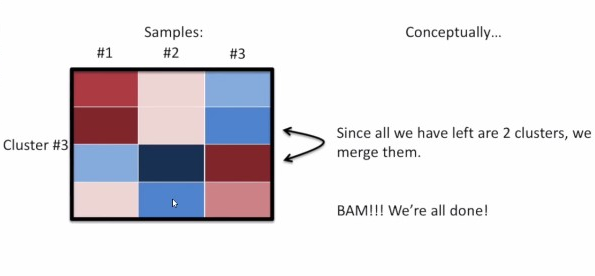

# NOTE:-
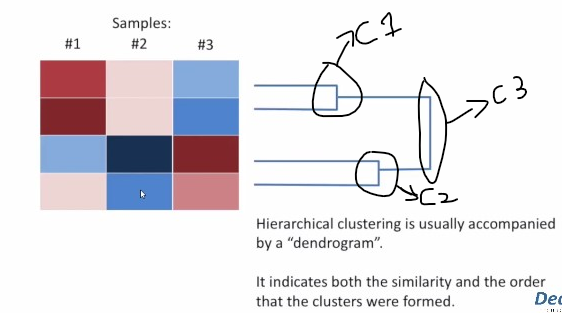
HERE...

    CLUSTER #1 WAS FORMED 1ST AND IS THE MOST SIMILAR...IT HAS THE SHORTEST BRANCH!
    CLUSTER #2 WAS FORMED 2ND AND IS THE 2ND MOST SIMILAR...IT HAS THE 2ND SHORTEST BRANCH!
    CLUSTER #3,WHICH CONTAINS ALL THE GENES WAS FORMED AT LAST...IT HAS THE LONGEST BRANCH!

# NOW...LET'S GO OVER A FEW DETAILS!

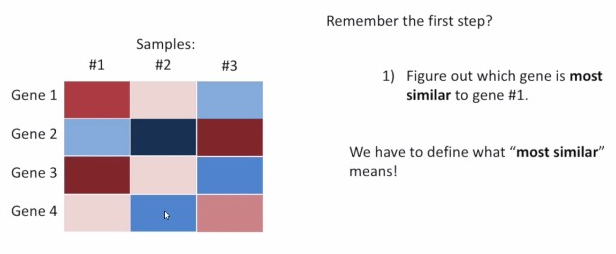
THE METHOD FOR DETERMINING THE SIMILARITY IS "ARBITRARILY" CHOSEN!

HOWEVER...THE EUCLIDIAN DUSTANCE B\W GENES IS USED A LOT!

# LET'S HAVE A LOOK AT AN EXAMPLE!
WE WILL USE A VERY SIMPLE HEAT MAPS(THAT ONLY HAS 2 GENES AND SAMPLES!)..WITH DISPLAYING THE VALUES IN IT!
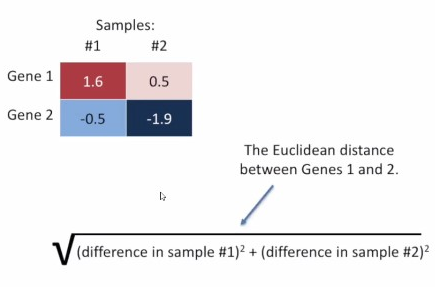

SO NOW...LET'S DO THE CALCULATIONS!
AND AT LAST WE END UP WITH THIS!(BELOW IMAGE)
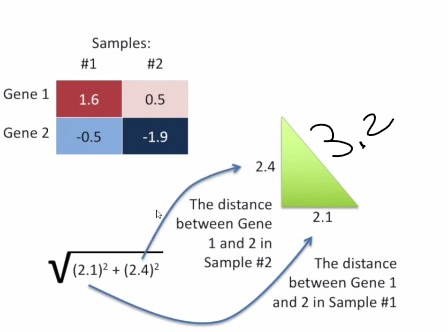
AND THW HYPOTENUSE IS THE TOTAL DIFFERENCE B\W GENE #1 AND GENE #2....AND HERE IT IS 3.2!

# NOTE-
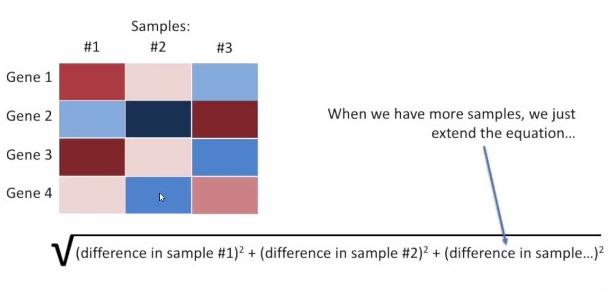

# Q/A
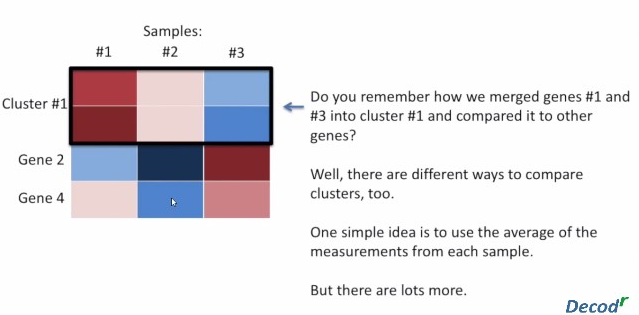

# SO NOW...LET'S TALK ABOUT THE DIFFERENT WAYS TO COMPARE THE CLUSTERS!
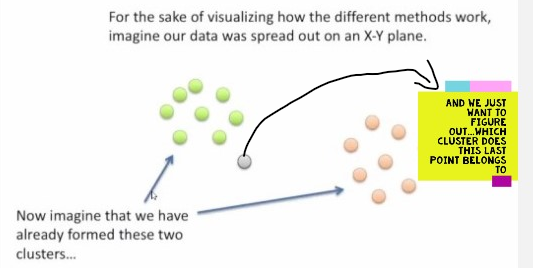
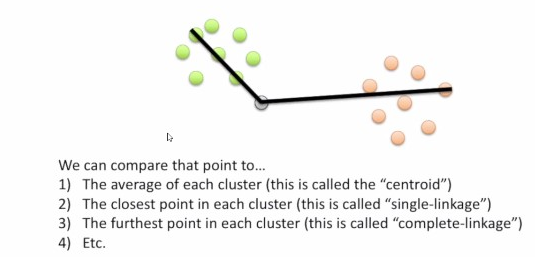

# FOR EXAMPLE:-
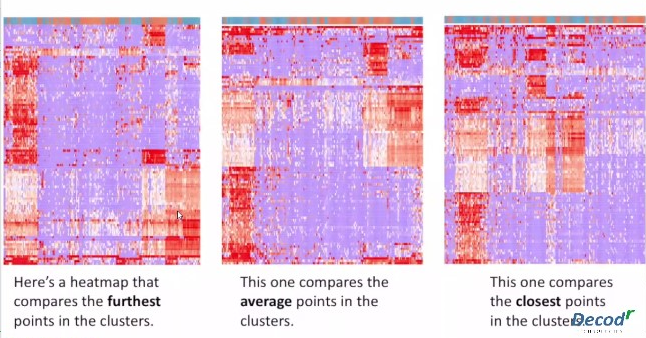

# IN SUMMARY!
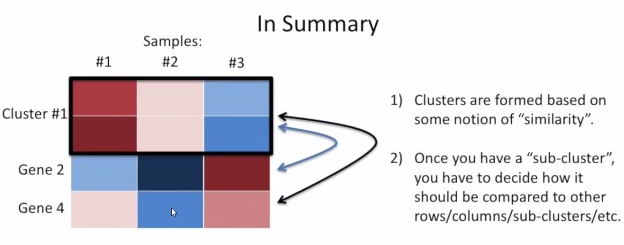
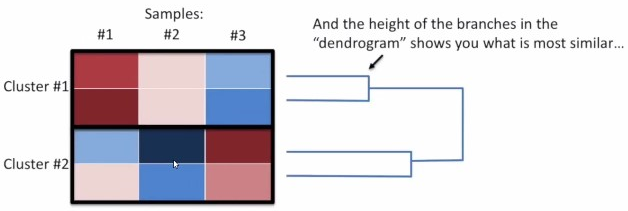

# •Implement hierarchical clustering!

In [52]:
# IMPORTING STUFFS!
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler,normalize
from sklearn.metrics import silhouette_score

import scipy.cluster.hierarchy as shc

In [53]:
newdf = pd.read_csv("D:\DATASETS/CC_GENERAL.csv")
newdf.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [54]:
newdf.shape

(8950, 18)

In [55]:
newdf.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [56]:
newdf.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [57]:
# DROPPING THE "CUST_ID" FROM THE DATA...AS IT DOES NOT MAKE NECESSARY OVER HERE!
x = newdf.drop('CUST_ID',axis = 1)

#HANDLING THE MISSING VALUES!
x.fillna(method = 'ffill',inplace = True)

In [58]:
x.isna().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [59]:
#PREPROCESSING/SCALING THE DATA...SO THAT ALL THE FEATURES BECOME COMPARABLE!
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

#NORMALIZING THE DATA SO THAT THE DATA APPROXIMATELY FOLLOWS A GAUSSIAN/NORMAL DISTRIBUTION!
x_normalized = normalize(x_scaled)

#CONVERTING THE NUMPY ARRAY INTO A PANDAS DATAFRAME
x_normalized = pd.DataFrame(x_normalized)
x_normalized.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-0.312038,-0.106331,-0.181129,-0.152156,-0.148808,-0.198985,-0.343796,-0.289304,-0.301518,-0.287892,-0.202942,-0.217975,-0.409413,-0.225497,-0.130160,-0.224036,0.153753
1,0.219928,0.037539,-0.131224,-0.099751,-0.127038,0.728177,-0.341439,-0.189662,-0.256269,0.160403,0.030762,-0.165387,0.192455,0.228782,0.024353,0.065458,0.100798
2,0.126684,0.146785,-0.030505,0.030851,-0.128792,-0.132251,0.359775,0.757449,-0.259805,-0.191342,-0.134881,-0.030888,0.234046,-0.108741,-0.028363,-0.148900,0.102189
3,0.020571,-0.426063,0.097223,0.228832,-0.190449,-0.154451,-0.424878,-0.167299,-0.384185,-0.108474,-0.138062,-0.231084,0.346093,-0.250827,-0.041942,-0.220185,0.151110
4,-0.151630,0.218959,-0.195282,-0.146778,-0.192118,-0.197278,-0.428601,-0.168765,-0.387551,-0.285424,-0.201202,-0.233109,-0.382671,-0.153993,-0.110323,-0.222114,0.152435


In [60]:
#REDUCING THE DIMENTIONALITY OF THE DATA!
pca = PCA(n_components= 2)
x_principal = pca.fit_transform(x_normalized)

x_principal = pd.DataFrame(x_principal)
x_principal.columns= ['P1','P2']

BUILD AND VISUALIZE THE DIFFERENT CLUSTERING MODELS FOR DIFFERENT VALUES OF K!

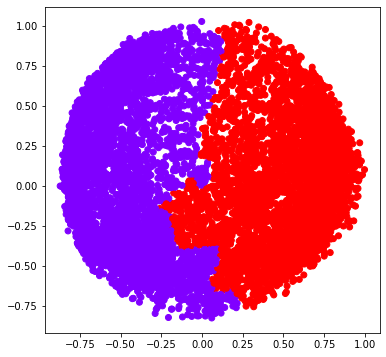

In [61]:
ac2 = AgglomerativeClustering(n_clusters = 2)

#visualizing the cluster
plt.figure(figsize = (6,6))
plt.scatter(x_principal['P1'],x_principal['P2'],
c= ac2.fit_predict(x_principal),cmap = 'rainbow')
plt.show()

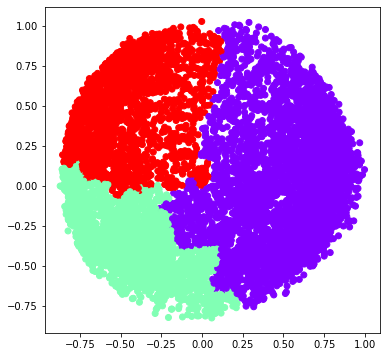

In [62]:
ac3 = AgglomerativeClustering(n_clusters = 3)

#visualizing the cluster
plt.figure(figsize = (6,6))
plt.scatter(x_principal['P1'],x_principal['P2'],
c= ac3.fit_predict(x_principal),cmap = 'rainbow')
plt.show()

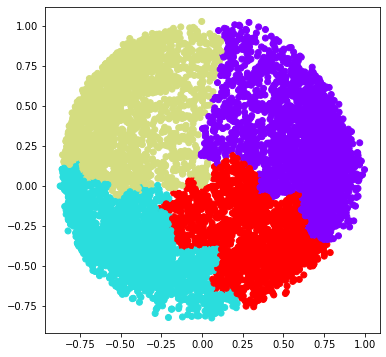

In [63]:
ac4 = AgglomerativeClustering(n_clusters = 4)

#visualizing the cluster
plt.figure(figsize = (6,6))
plt.scatter(x_principal['P1'],x_principal['P2'],
c= ac4.fit_predict(x_principal),cmap = 'rainbow')
plt.show()

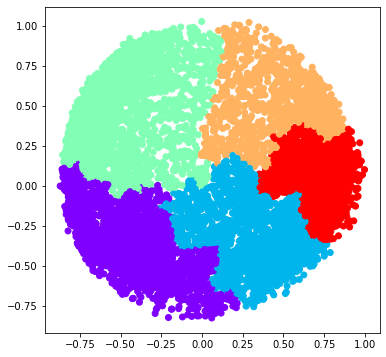

In [64]:
ac5 = AgglomerativeClustering(n_clusters = 5)

#visualizing the cluster
plt.figure(figsize = (6,6))
plt.scatter(x_principal['P1'],x_principal['P2'],
c= ac5.fit_predict(x_principal),cmap = 'rainbow')
plt.show()

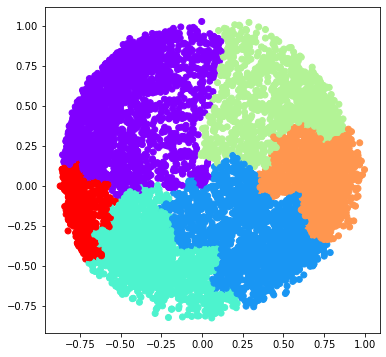

In [65]:
ac6 = AgglomerativeClustering(n_clusters = 6)

#visualizing the cluster
plt.figure(figsize = (6,6))
plt.scatter(x_principal['P1'],x_principal['P2'],
c= ac6.fit_predict(x_principal),cmap = 'rainbow')
plt.show()

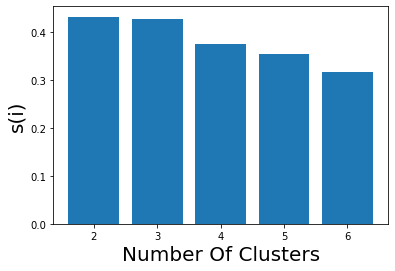

In [66]:
k = [2,3,4,5,6]

#APPENDING THE "silhoutte_score" of the different models to the list
silhouette_scores = []
silhouette_scores.append(
silhouette_score(x_principal,ac2.fit_predict(x_principal)))
silhouette_scores.append(
silhouette_score(x_principal,ac3.fit_predict(x_principal)))
silhouette_scores.append(
silhouette_score(x_principal,ac4.fit_predict(x_principal)))
silhouette_scores.append(
silhouette_score(x_principal,ac5.fit_predict(x_principal)))
silhouette_scores.append(
silhouette_score(x_principal,ac6.fit_predict(x_principal)))

# PLOTTING A BAR GRAPH TO COMPARE THYE RESULTS

plt.bar(k,silhouette_scores)
plt.xlabel("Number Of Clusters",fontsize = 20)
plt.ylabel("s(i)",fontsize = 20)
plt.show()